# PCA Index Dashboard Examples

In [1]:
import pandas as pd
import plotly.express as px

import config
import load_fred
import pca_index

DATA_DIR = config.DATA_DIR

import warnings
warnings.filterwarnings("ignore")

In [2]:
now = pd.Timestamp.utcnow()
# convert now to central time 
print(f"This script was last run at {now} (UTC)")
print(f"In US/Central Time, this is {now.tz_convert('US/Central')}")

This script was last run at 2024-03-09 03:53:03.004986+00:00 (UTC)
In US/Central Time, this is 2024-03-08 21:53:03.004986-06:00


In [12]:
df = load_fred.load_fred(data_dir=DATA_DIR)
dfn = pca_index.transform_series(df)
dfn

,High Yield Index OAS,10Y-2Y Spread,VIX,"CP - Treasury Spread, 3m",NASDAQ Ret (transformed),10-Year Treasury (transformed)
DATE,,,,,,
1997-01-02,-0.897988,-0.477039,0.085120,-0.006441,0.546317,0.254862
1997-01-03,-0.886281,-0.477039,-0.156623,0.009089,0.745870,0.205723
1997-01-06,-0.882378,-0.477039,-0.065218,-0.014206,0.778743,0.269641
1997-01-07,-0.882378,-0.456202,-0.130164,-0.045266,0.838361,0.383210
1997-01-08,-0.894086,-0.456202,-0.023123,-0.084091,0.786403,0.496387
...,...,...,...,...,...,...
2024-03-04,-0.819938,-1.477212,-0.834946,1.670809,1.462380,0.115371
2024-03-05,-0.800426,-1.498049,-0.718284,1.670809,1.214639,-0.158854
2024-03-06,-0.816036,-1.529304,-0.713473,1.670809,1.123882,-0.203238


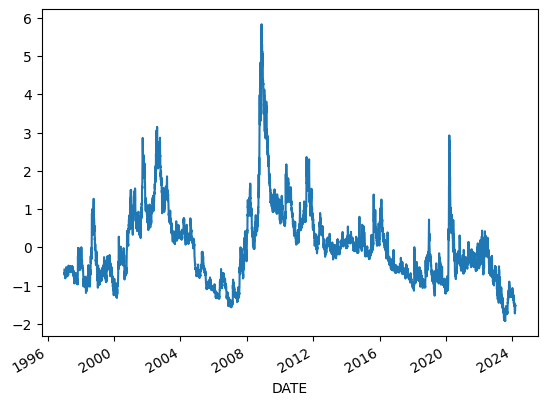

In [4]:
## Visualize Principal Component 1
pc1, loadings = pca_index.pca(dfn, module="scikitlearn")
pc1.plot();

In [14]:
pc1

DATE
1997-01-02   -0.580229
1997-01-03   -0.686473
1997-01-06   -0.669354
1997-01-07   -0.705785
1997-01-08   -0.675439
                ...   
2024-03-04   -1.656300
2024-03-05   -1.525994
2024-03-06   -1.512647
2024-03-07   -1.532730
2024-03-08   -1.522166
Name: PC1, Length: 7183, dtype: float64

<Axes: xlabel='DATE'>

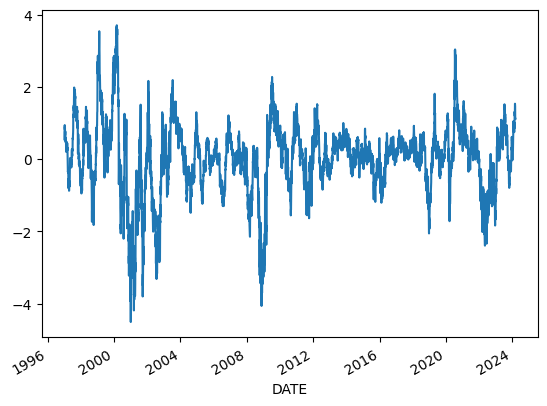

In [13]:
# NEW PLOT
dfn['NASDAQ Ret (transformed)'].plot()

In [ ]:
fig = px.line(pc1)
fig.show()

In [7]:
# Simple version
fig = px.line(pc1)
fig.show()

In [6]:
# Using slider and quick views
pca_index.pc1_line_plot(pc1)

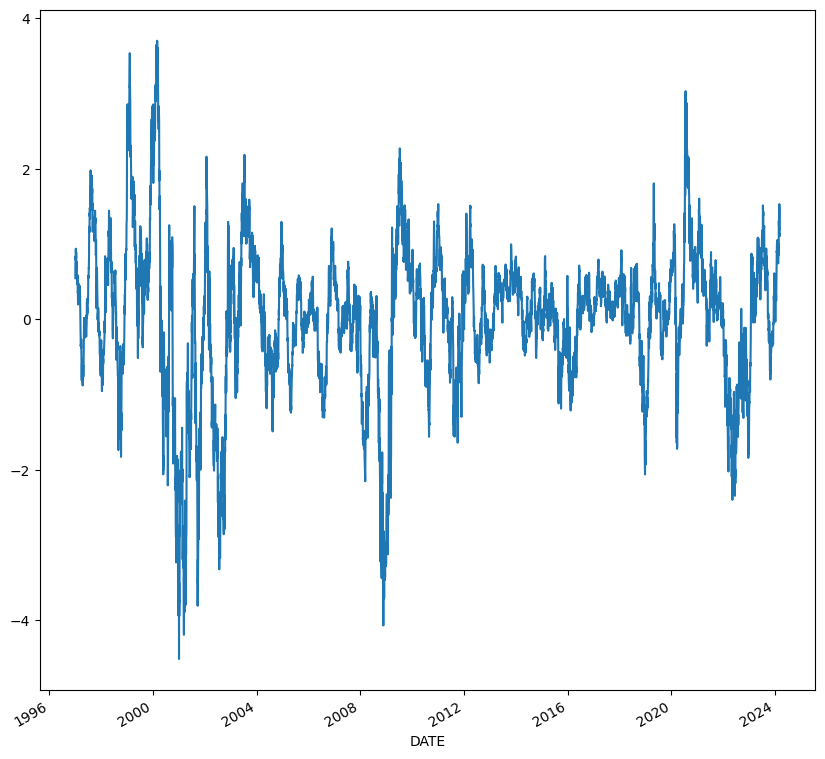

In [15]:
## Visualize normalized and raw series
dfn['NASDAQ Ret (transformed)'].plot(subplots=True, figsize=(10, 10));


In [8]:
fig = px.line(dfn, facet_col="variable", facet_col_wrap=1)
fig.update_yaxes(matches=None)
fig.show()


In [9]:
pca_index.plot_unnormalized_series(df)

In [10]:
pca_index.plot_normalized_series(dfn)